In [131]:
import Pkg
Pkg.activate(".")

  Activating project at `~/Documents/MPSTime.jl`


In [277]:
ENV["GR_FONT_PATH"] = "/Library/Fonts"
using Plots
gr()

Plots.GRBackend()

In [133]:
using MPSTime
using Plots
using JLD2
using Random
using DelimitedFiles
using Optimization
using OptimizationBBO
using KernelDensity
using Plots.PlotMeasures
using StatsBase
using ColorSchemes

# ECG

Load in the ECG data

In [2]:
ecg_base_dir = "Folds/ECG200/"
ecg_train = readdlm(ecg_base_dir*"ECG200_TRAIN.txt");
X_train_ecg = ecg_train[:, 2:end];
y_train_ecg = ecg_train[:, 1]
@assert size(X_train_ecg, 2) == 96 "Expected length 96 time series."
@assert size(X_train_ecg, 1) == 100 "Expected 100 training instances"

In [196]:
chi_max = 80
d = 18
eta = 0.05
nsweeps = 10
mps_opts = MPSOptions(; d = d, chi_max=chi_max, nsweeps=nsweeps, eta=eta, sigmoid_transform=false, verbosity=1, log_level=-1);

In [197]:
mps, _, _ = fitMPS(X_train_ecg, mps_opts)

Generating initial weight MPS with bond dimension χ_init = 4
        using random state 1234.
Initialising train states.
blas_name = "LBTConfig([ILP64] libopenblas64_.dylib)"
Using 1 iterations per update.
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [1/10]


┌ Warning: Not using MKL BLAS, which may lead to worse performance.
│ To fix this, Import MPSTime into Julia first or use the MKL package
└ @ MPSTime /Users/jmoo2880/Documents/MPSTime.jl/src/Training/RealRealHighDimension.jl:829


Backward sweep finished.
Starting forward sweep: [1/10]
Finished sweep 1. Time for sweep: 19.51s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [2/10]
Backward sweep finished.
Starting forward sweep: [2/10]
Finished sweep 2. Time for sweep: 105.9s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [3/10]
Backward sweep finished.
Starting forward sweep: [3/10]
Finished sweep 3. Time for sweep: 106.25s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [4/10]
Backward sweep finished.
Starting forward sweep: [4/10]
Finished sweep 4. Time for sweep: 102.38s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [5/10]
Backward sweep finished.
Starting forward sweep: [5/10]
Finished sweep 5. Time for sweep: 102.99s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [6/10]
Backward sweep finished.
Starting forward sweep: [6/10]
Finished sweep 6. Time for sweep: 10

3-element Vector{Any}:
 TrainedMPS(ITensors.ITensorMPS.MPS
[1] ((dim=18|id=658|"Site,n=1"), (dim=15|id=972|"Link,l=1"))
[2] ((dim=18|id=89|"Site,n=2"), (dim=15|id=972|"Link,l=1"), (dim=80|id=26|"Link,l=2"))
[3] ((dim=18|id=323|"Site,n=3"), (dim=80|id=26|"Link,l=2"), (dim=80|id=99|"Link,l=3"))
[4] ((dim=18|id=410|"Site,n=4"), (dim=80|id=99|"Link,l=3"), (dim=80|id=689|"Link,l=4"))
[5] ((dim=18|id=80|"Site,n=5"), (dim=80|id=689|"Link,l=4"), (dim=80|id=750|"Link,l=5"))
[6] ((dim=18|id=177|"Site,n=6"), (dim=80|id=750|"Link,l=5"), (dim=80|id=87|"Link,l=6"))
[7] ((dim=18|id=854|"Site,n=7"), (dim=80|id=87|"Link,l=6"), (dim=80|id=181|"Link,l=7"))
[8] ((dim=18|id=190|"Site,n=8"), (dim=80|id=181|"Link,l=7"), (dim=80|id=463|"Link,l=8"))
[9] ((dim=18|id=145|"Site,n=9"), (dim=80|id=463|"Link,l=8"), (dim=80|id=706|"Link,l=9"))
[10] ((dim=18|id=248|"Site,n=10"), (dim=80|id=706|"Link,l=9"), (dim=80|id=643|"Link,l=10"))
[11] ((dim=18|id=978|"Site,n=11"), (dim=80|id=643|"Link,l=10"), (dim=80|id=724|"Link

In [198]:
imp_ecg = init_imputation_problem(mps, X_train_ecg)

Initialising train states.
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 100 training samples and 100 testing samples.
Slicing MPS into individual states...
 - 1 class(es) were detected.
 - Time independent encoding - Legendre - detected.
 - d = 18, chi_max = 80
Re-encoding the training data to get the encoding arguments...

 Created 1 ImputationProblem struct(s) containing class-wise mps and test samples.


ImputationProblem(ITensors.ITensorMPS.MPS[ITensors.ITensorMPS.MPS
[1] ((dim=18|id=658|"Site,n=1"), (dim=15|id=972|"Link,l=1"))
[2] ((dim=18|id=89|"Site,n=2"), (dim=15|id=972|"Link,l=1"), (dim=80|id=26|"Link,l=2"))
[3] ((dim=18|id=323|"Site,n=3"), (dim=80|id=26|"Link,l=2"), (dim=80|id=99|"Link,l=3"))
[4] ((dim=18|id=410|"Site,n=4"), (dim=80|id=99|"Link,l=3"), (dim=80|id=689|"Link,l=4"))
[5] ((dim=18|id=80|"Site,n=5"), (dim=80|id=689|"Link,l=4"), (dim=80|id=750|"Link,l=5"))
[6] ((dim=18|id=177|"Site,n=6"), (dim=80|id=750|"Link,l=5"), (dim=80|id=87|"Link,l=6"))
[7] ((dim=18|id=854|"Site,n=7"), (dim=80|id=87|"Link,l=6"), (dim=80|id=181|"Link,l=7"))
[8] ((dim=18|id=190|"Site,n=8"), (dim=80|id=181|"Link,l=7"), (dim=80|id=463|"Link,l=8"))
[9] ((dim=18|id=145|"Site,n=9"), (dim=80|id=463|"Link,l=8"), (dim=80|id=706|"Link,l=9"))
[10] ((dim=18|id=248|"Site,n=10"), (dim=80|id=706|"Link,l=9"), (dim=80|id=643|"Link,l=10"))
[11] ((dim=18|id=978|"Site,n=11"), (dim=80|id=643|"Link,l=10"), (dim=80|id=72

"IMPUTE" all sites with no pre-conditioning.

In [199]:
imputed_ts_ecg, pred_err_ecg, target_ts_ecg, stats_ecg, plots_ecg = MPS_impute(imp_ecg, 0, 1, collect(1:96), :ITS; rseed=42, num_trajectories=100, rejection_threshold=2.0)

([[0.994452287075001, 1.980773718725, 1.8055943075750007, 1.4552354852750011, 0.49992830735000027, -0.22157911172499922, 0.82847490725, 0.8100708446000007, 0.8131381883750004, 1.0493236590500006  …  0.34962846237500056, 0.20648575287500037, 0.030283893800000072, 0.17478986720000034, 0.7872361742750007, 2.7033035857250014, 2.181855143975001, 1.57690678835, 0.7875769902500003, -0.48230333259999947], [0.7344096981500008, 1.2425663168750005, 1.701304619225001, 2.2783060649, 2.1269837720000004, 2.169926584850001, 1.6368903999500009, 1.2446112127250006, 0.40790799410000034, 0.06947773092500054  …  0.13286950227500016, 0.5599119189500006, 0.38677740365000046, 0.21091636055000018, 0.4866364843250004, 0.5714996621000004, 0.1178735993750002, 0.4542589667000003, 0.6066037075250001, 0.30089177795000044], [1.0329644922500005, 2.7155729608250003, 3.599308784, 2.413950822950001, 0.7456566253250005, -0.23078114304999975, 1.0980603434750007, 0.9688910889500004, 1.2033724797500005, 1.211892879125  …  -0

In [200]:
mean_synthetic = mean(imputed_ts_ecg)
std_synthetic = std(imputed_ts_ecg)
mean_real = mean(X_train_ecg; dims=1)[1, :]
std_real = std(X_train_ecg; dims=1)[1, :]

96-element Vector{Float64}:
 0.5935128982505872
 0.9279719819328901
 1.0468800211894889
 1.098753662034098
 0.9547343215125306
 0.9631108612044943
 1.0967122827421285
 0.8776404248424444
 0.7617531971905132
 0.7391851359895361
 ⋮
 0.4340019749182154
 0.4543948842482049
 0.5898787384177827
 0.7721036765405389
 0.8710452248428904
 0.8323122916607146
 0.6655482967807774
 0.619798649957833
 0.41364376515603196

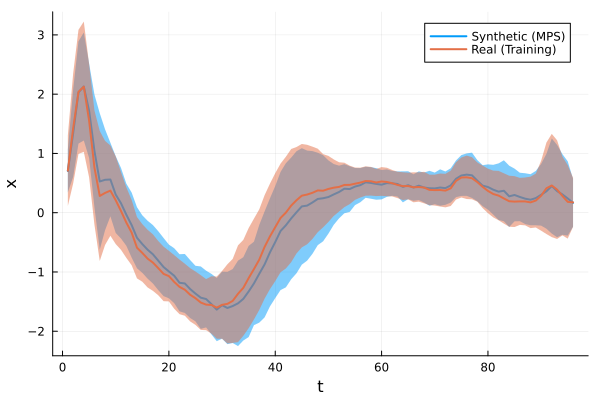

In [201]:
plot(mean_synthetic, xlabel="t", ylabel="x", label="Synthetic (MPS)", ribbon=std_synthetic,ribbon_alpha=0.3, lw=2)
plot!(mean_real, label="Real (Training)", ribbon=std_real, ribbon_alpha=0.3, lw=2)

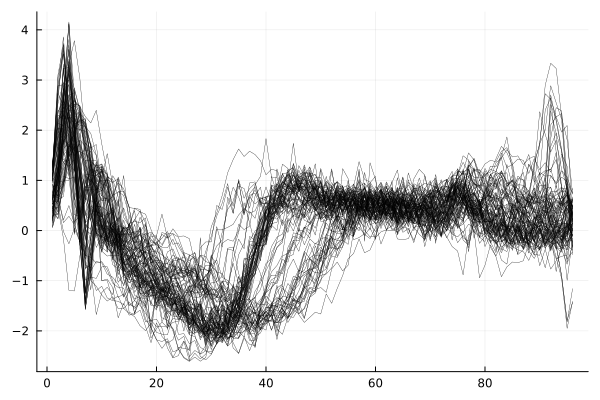

In [202]:
plot(imputed_ts_ecg, label="", c="black", lw=0.3)
#plot!(X_train_ecg', label="", c="red", lw=0.3)

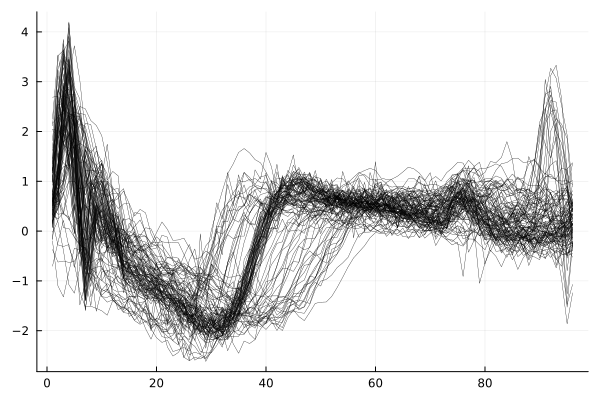

In [203]:
plot(X_train_ecg', label="", c="black", lw=0.3)

In [204]:
maximum([0.3, 0.4, 0.5])

0.5

In [327]:
function truncated_colormap(cmap::ColorScheme, start::Float64, stop::Float64, n::Int=256)
    ra = range(start, stop; length=n)
    colors = [get(cmap, r) for r in ra]
    return cgrad(colors)
end
my_cmap = truncated_colormap(ColorSchemes.magma, 0.0, 0.6)

In [ ]:
function make_kde_heatmap(trajectories::AbstractMatrix{<:Real}, which_pts_imputed::Union{Vector, UnitRange}, 
    overplot_samples::Union{Nothing, Int}=nothing; max_x=nothing, min_x=nothing, include_cbar::Bool=true)

    kde_vals = []
    x_vals = []
    n_tpts = size(trajectories, 2)
    fixed_pts = setdiff(1:n_tpts, which_pts_imputed) # conditioning points
    if isnothing(max_x)
        @show max_x = maximum(maximum(trajectories, dims=2))
    end
    if isnothing(min_x)
        @show min_x = minimum(minimum(trajectories, dims=2))
    end
    # time-marginalized density
    for t in 1:size(trajectories, 2)
        kde_v = kde(trajectories[:, t]; boundary=(min_x, max_x), npoints=1000)
        normalised_density = kde_v.density./maximum(kde_v.density)
        push!(kde_vals, normalised_density)
        push!(x_vals, kde_v.x)
    end
    kde_matrix = hcat(kde_vals...)';
    if length(fixed_pts) != 0
        kde_matrix[fixed_pts, :] = zeros(length(fixed_pts), size(kde_matrix, 2))
    end
    xval_matrix = hcat(x_vals...)';
    fstyle = font("arial", 23)
    p = heatmap(collect(1:size(trajectories, 2)), xval_matrix[1, :], kde_matrix', c=my_cmap, 
        alpha=0.96, xlabel="t", ylabel="x", xlims=(1, size(trajectories, 2)), ylims=(min_x, max_x),
        xtickfont=fstyle,
        ytickfont=fstyle,
        guidefont=fstyle,
        titlefont=fstyle,
        size=(1200, 600),
        left_margin=10mm,
        right_margin=10mm,
        bottom_margin=10mm,
        colorbar=:none)
    if length(fixed_pts) > 0
        vline!([which_pts_imputed[1]-1], lw=2, ls=:dot, c=:white, label="")
    end

    if !isnothing(overplot_samples)
        # sample random trajectories and overplot them
        pidxs = sample(1:size(trajectories, 1), overplot_samples; replace=false)
        for pid in pidxs
            plot!(collect(which_pts_imputed), trajectories[pid, which_pts_imputed], c=:white, lw=2, 
                alpha=0.05, label="")
        end
    end

    return p 

end

make_kde_heatmap (generic function with 2 methods)

In [331]:
ecg_train_dist = make_kde_heatmap(X_train_ecg, collect(1:96), 100, max_x=4.5, min_x=-3.0)
ecg_synth_dist = make_kde_heatmap(hcat(imputed_ts_ecg...)', collect(1:96), 100, max_x=4.5, min_x=-3.0);

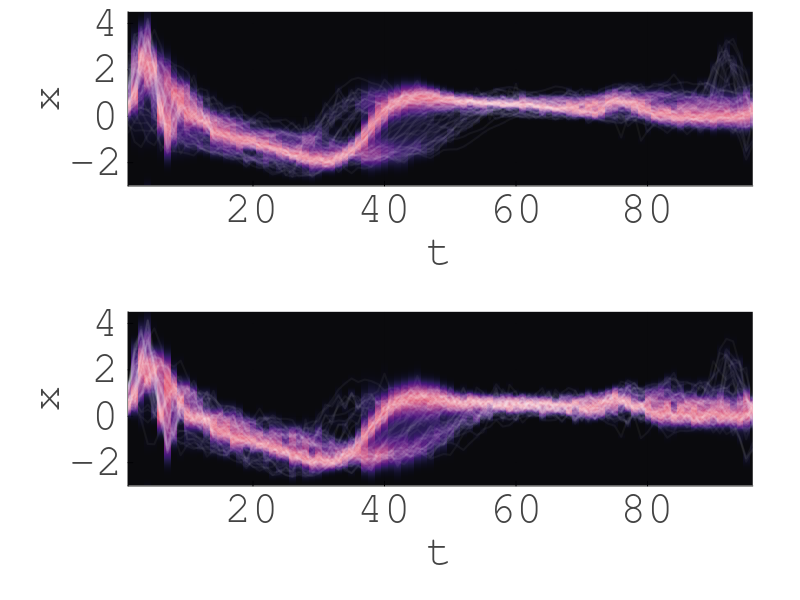

In [332]:
plot(ecg_train_dist, ecg_synth_dist, layout=(2, 1), size=(800, 600))

# IPD

Load the IPD data

In [208]:
ipd_base_dir = "Folds/IPD/"
ipd_train = readdlm(ipd_base_dir*"ItalyPowerDemand_TRAIN.txt");
X_train_ipd = ipd_train[:, 2:end];
y_train_ipd = ipd_train[:, 1]
@assert size(X_train_ipd, 2) == 24 "Expected length 96 time series."
@assert size(X_train_ipd, 1) == 67 "Expected 100 training instances"

Use the same opts as for ECG

In [209]:
mps_ipd, _, _ = fitMPS(X_train_ipd, mps_opts)

Generating initial weight MPS with bond dimension χ_init = 4
        using random state 1234.
Initialising train states.
blas_name = "LBTConfig([ILP64] libopenblas64_.dylib)"
Using 1 iterations per update.
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [1/10]


┌ Warning: Not using MKL BLAS, which may lead to worse performance.
│ To fix this, Import MPSTime into Julia first or use the MKL package
└ @ MPSTime /Users/jmoo2880/Documents/MPSTime.jl/src/Training/RealRealHighDimension.jl:829


Backward sweep finished.
Starting forward sweep: [1/10]
Finished sweep 1. Time for sweep: 4.15s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [2/10]
Backward sweep finished.
Starting forward sweep: [2/10]
Finished sweep 2. Time for sweep: 17.7s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [3/10]
Backward sweep finished.
Starting forward sweep: [3/10]
Finished sweep 3. Time for sweep: 18.66s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [4/10]
Backward sweep finished.
Starting forward sweep: [4/10]
Finished sweep 4. Time for sweep: 18.48s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [5/10]
Backward sweep finished.
Starting forward sweep: [5/10]
Finished sweep 5. Time for sweep: 18.43s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [6/10]
Backward sweep finished.
Starting forward sweep: [6/10]
Finished sweep 6. Time for sweep: 18.61s


3-element Vector{Any}:
 TrainedMPS(ITensors.ITensorMPS.MPS
[1] ((dim=18|id=490|"Site,n=1"), (dim=16|id=270|"Link,l=1"))
[2] ((dim=18|id=271|"Site,n=2"), (dim=16|id=270|"Link,l=1"), (dim=72|id=316|"Link,l=2"))
[3] ((dim=18|id=910|"Site,n=3"), (dim=72|id=316|"Link,l=2"), (dim=80|id=247|"Link,l=3"))
[4] ((dim=18|id=719|"Site,n=4"), (dim=80|id=247|"Link,l=3"), (dim=80|id=521|"Link,l=4"))
[5] ((dim=18|id=38|"Site,n=5"), (dim=80|id=521|"Link,l=4"), (dim=80|id=725|"Link,l=5"))
[6] ((dim=18|id=129|"Site,n=6"), (dim=80|id=725|"Link,l=5"), (dim=80|id=856|"Link,l=6"))
[7] ((dim=18|id=345|"Site,n=7"), (dim=80|id=856|"Link,l=6"), (dim=80|id=111|"Link,l=7"))
[8] ((dim=18|id=98|"Site,n=8"), (dim=80|id=111|"Link,l=7"), (dim=80|id=796|"Link,l=8"))
[9] ((dim=18|id=151|"Site,n=9"), (dim=80|id=796|"Link,l=8"), (dim=80|id=411|"Link,l=9"))
[10] ((dim=18|id=321|"Site,n=10"), (dim=80|id=411|"Link,l=9"), (dim=80|id=765|"Link,l=10"))
[11] ((dim=18|id=248|"Site,n=11"), (dim=80|id=765|"Link,l=10"), (dim=80|id=70|

In [210]:
imp_ipd = init_imputation_problem(mps_ipd, X_train_ipd)

Initialising train states.
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 67 training samples and 67 testing samples.
Slicing MPS into individual states...
 - 1 class(es) were detected.
 - Time independent encoding - Legendre - detected.
 - d = 18, chi_max = 80
Re-encoding the training data to get the encoding arguments...

 Created 1 ImputationProblem struct(s) containing class-wise mps and test samples.


ImputationProblem(ITensors.ITensorMPS.MPS[ITensors.ITensorMPS.MPS
[1] ((dim=18|id=490|"Site,n=1"), (dim=16|id=270|"Link,l=1"))
[2] ((dim=18|id=271|"Site,n=2"), (dim=16|id=270|"Link,l=1"), (dim=72|id=316|"Link,l=2"))
[3] ((dim=18|id=910|"Site,n=3"), (dim=72|id=316|"Link,l=2"), (dim=80|id=247|"Link,l=3"))
[4] ((dim=18|id=719|"Site,n=4"), (dim=80|id=247|"Link,l=3"), (dim=80|id=521|"Link,l=4"))
[5] ((dim=18|id=38|"Site,n=5"), (dim=80|id=521|"Link,l=4"), (dim=80|id=725|"Link,l=5"))
[6] ((dim=18|id=129|"Site,n=6"), (dim=80|id=725|"Link,l=5"), (dim=80|id=856|"Link,l=6"))
[7] ((dim=18|id=345|"Site,n=7"), (dim=80|id=856|"Link,l=6"), (dim=80|id=111|"Link,l=7"))
[8] ((dim=18|id=98|"Site,n=8"), (dim=80|id=111|"Link,l=7"), (dim=80|id=796|"Link,l=8"))
[9] ((dim=18|id=151|"Site,n=9"), (dim=80|id=796|"Link,l=8"), (dim=80|id=411|"Link,l=9"))
[10] ((dim=18|id=321|"Site,n=10"), (dim=80|id=411|"Link,l=9"), (dim=80|id=765|"Link,l=10"))
[11] ((dim=18|id=248|"Site,n=11"), (dim=80|id=765|"Link,l=10"), (dim=80

In [211]:
imputed_ts_ipd, pred_err_ipd, target_ts_ipd, stats_ipd, plots_ipd = MPS_impute(imp_ipd, 0, 1, collect(1:24), :ITS; rseed=42, num_trajectories=67, rejection_threshold=2.0)

([[-0.3900288394749998, -0.9292023540250001, -1.47566199715, -1.6158647742749999, -1.710805237525, -1.47477883005, -1.023259650175, -0.940021151, -0.367508078425, 0.9609960317499997  …  0.5494401631500003, 0.95658019625, 0.9395792295749996, 0.5637916285250002, 0.18447135907499979, 0.021306237350000146, -0.2485013116999999, 1.3628370622500001, 0.7505814701750002, -0.05310059082499996], [-0.8287420964000001, -1.0389358662000001, -1.4440887733249999, -1.638827118875, -1.7728477263, -1.4513749019000002, -0.8631856133000002, -0.45074657760000014, 0.07319230447500003, 0.4452264453499999  …  0.18513373439999992, 0.06259429927500015, 0.3123097967999997, 0.9872702529750002, 1.4825062043, 1.3328093808499997, 1.22329666045, 0.5973519783249999, 0.22244754437500003, -0.3860545875250001], [-0.24099439135000011, -0.8446391042000001, -1.418918510975, -1.4255422642250002, -1.4990659253, -1.4301788915, -1.17803468445, -0.6538750106, -0.2935428337999999, 0.18491294262500002  …  -0.48033267545000013, -0.3

In [333]:
ipd_train_dist = make_kde_heatmap(X_train_ipd, collect(1:24), 67, max_x=2.5, min_x=-2.0)
ipd_synth_dist = make_kde_heatmap(hcat(imputed_ts_ipd...)', collect(1:24), 67, max_x=2.5, min_x=-2.0);

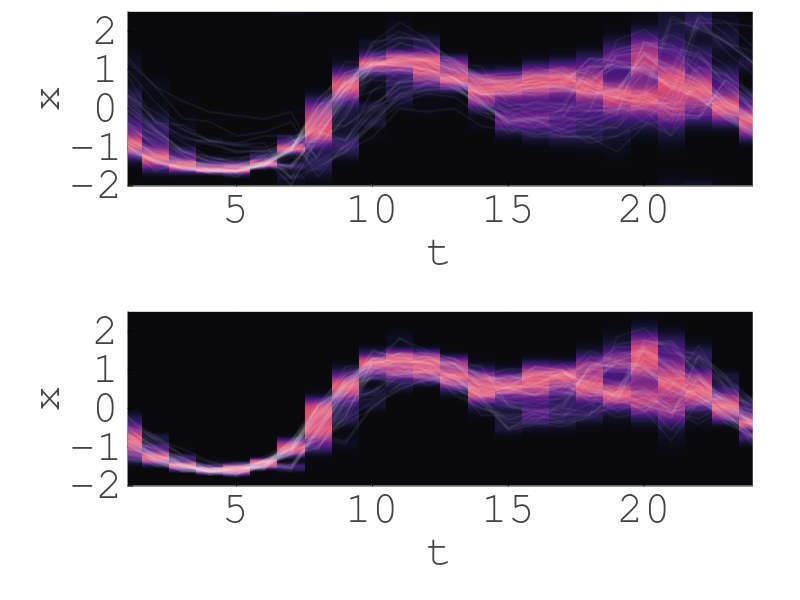

In [334]:
plot(ipd_train_dist, ipd_synth_dist, layout=(2, 1), size=(800, 600))

# NTS6

In [76]:
period = [20, 30, 40]
trend = [-3.0, 0.0, 3.0]
X_train_nts, info = trendy_sine(100, 600; period=period, slope=trend, sigma=0.1, rng=Xoshiro(634655));

In [ ]:
mps_nts, _ = fitMPS(X_train_nts, mps_opts)

Generating initial weight MPS with bond dimension χ_init = 4
        using random state 1234.
Initialising train states.
blas_name = "LBTConfig([ILP64] libopenblas64_.dylib)"
Using 1 iterations per update.
Using optimiser CustomGD with the "TSGO" algorithm

┌ Warning: Not using MKL BLAS, which may lead to worse performance.
│ To fix this, Import MPSTime into Julia first or use the MKL package
└ @ MPSTime /Users/jmoo2880/Documents/MPSTime.jl/src/Training/RealRealHighDimension.jl:829



Starting backward sweeep: [1/10]
Backward sweep finished.
Starting forward sweep: [1/10]
Finished sweep 1. Time for sweep: 89.93s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [2/10]
Backward sweep finished.
Starting forward sweep: [2/10]
Finished sweep 2. Time for sweep: 271.57s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [3/10]
Backward sweep finished.
Starting forward sweep: [3/10]
Finished sweep 3. Time for sweep: 272.77s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [4/10]
Backward sweep finished.
Starting forward sweep: [4/10]
Finished sweep 4. Time for sweep: 270.18s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [5/10]
Backward sweep finished.
Starting forward sweep: [5/10]
Finished sweep 5. Time for sweep: 270.9s
Using optimiser CustomGD with the "TSGO" algorithm
Starting backward sweeep: [6/10]
Backward sweep finished.
Starting forward sweep: [6/10]
Fi

3-element Vector{Any}:
 TrainedMPS(ITensors.ITensorMPS.MPS
[1] ((dim=18|id=188|"Site,n=1"), (dim=12|id=640|"Link,l=1"))
[2] ((dim=18|id=274|"Site,n=2"), (dim=12|id=640|"Link,l=1"), (dim=58|id=763|"Link,l=2"))
[3] ((dim=18|id=298|"Site,n=3"), (dim=58|id=763|"Link,l=2"), (dim=80|id=473|"Link,l=3"))
[4] ((dim=18|id=588|"Site,n=4"), (dim=80|id=473|"Link,l=3"), (dim=80|id=660|"Link,l=4"))
[5] ((dim=18|id=185|"Site,n=5"), (dim=80|id=660|"Link,l=4"), (dim=80|id=760|"Link,l=5"))
[6] ((dim=18|id=330|"Site,n=6"), (dim=80|id=760|"Link,l=5"), (dim=80|id=190|"Link,l=6"))
[7] ((dim=18|id=536|"Site,n=7"), (dim=80|id=190|"Link,l=6"), (dim=80|id=290|"Link,l=7"))
[8] ((dim=18|id=117|"Site,n=8"), (dim=80|id=290|"Link,l=7"), (dim=80|id=502|"Link,l=8"))
[9] ((dim=18|id=81|"Site,n=9"), (dim=80|id=502|"Link,l=8"), (dim=80|id=980|"Link,l=9"))
[10] ((dim=18|id=112|"Site,n=10"), (dim=80|id=980|"Link,l=9"), (dim=80|id=916|"Link,l=10"))
[11] ((dim=18|id=348|"Site,n=11"), (dim=80|id=916|"Link,l=10"), (dim=80|id=85

In [192]:
imp_nts = init_imputation_problem(mps_nts, X_train_nts)

Initialising train states.
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 600 training samples and 600 testing samples.
Slicing MPS into individual states...
 - 1 class(es) were detected.
 - Time independent encoding - Legendre - detected.
 - d = 18, chi_max = 80
Re-encoding the training data to get the encoding arguments...

 Created 1 ImputationProblem struct(s) containing class-wise mps and test samples.


ImputationProblem(ITensors.ITensorMPS.MPS[ITensors.ITensorMPS.MPS
[1] ((dim=18|id=188|"Site,n=1"), (dim=12|id=640|"Link,l=1"))
[2] ((dim=18|id=274|"Site,n=2"), (dim=12|id=640|"Link,l=1"), (dim=58|id=763|"Link,l=2"))
[3] ((dim=18|id=298|"Site,n=3"), (dim=58|id=763|"Link,l=2"), (dim=80|id=473|"Link,l=3"))
[4] ((dim=18|id=588|"Site,n=4"), (dim=80|id=473|"Link,l=3"), (dim=80|id=660|"Link,l=4"))
[5] ((dim=18|id=185|"Site,n=5"), (dim=80|id=660|"Link,l=4"), (dim=80|id=760|"Link,l=5"))
[6] ((dim=18|id=330|"Site,n=6"), (dim=80|id=760|"Link,l=5"), (dim=80|id=190|"Link,l=6"))
[7] ((dim=18|id=536|"Site,n=7"), (dim=80|id=190|"Link,l=6"), (dim=80|id=290|"Link,l=7"))
[8] ((dim=18|id=117|"Site,n=8"), (dim=80|id=290|"Link,l=7"), (dim=80|id=502|"Link,l=8"))
[9] ((dim=18|id=81|"Site,n=9"), (dim=80|id=502|"Link,l=8"), (dim=80|id=980|"Link,l=9"))
[10] ((dim=18|id=112|"Site,n=10"), (dim=80|id=980|"Link,l=9"), (dim=80|id=916|"Link,l=10"))
[11] ((dim=18|id=348|"Site,n=11"), (dim=80|id=916|"Link,l=10"), (dim=8

In [193]:
imputed_ts_nts, pred_err_nts, target_ts_nts, stats_nts, plots_nts = MPS_impute(imp_nts, 0, 1, collect(1:100), :ITS; rseed=4567, num_trajectories=600, rejection_threshold=2.0)

([[0.8344063485077653, 0.713121166401498, 0.7824269847479366, 0.7211504990148043, 0.557183075122011, 0.5132330439754886, 0.0014687389905052584, -0.02177406594275144, -0.6315807481007458, -0.2715285698619301  …  -3.3505663288384686, -3.825987338836905, -3.9599504145431306, -3.7025891744639776, -3.5217178924379056, -3.5441155044644983, -3.5149563491845948, -2.99854348321296, -2.9334636293998404, -2.452971461961421], [0.40547094837584297, 0.786230352827924, 1.0017545440272153, 0.7680587053346501, 0.7384769536014142, 0.7511548472013718, 0.48745466032224005, -0.06699188644926934, -0.2533569223686567, -0.5335383709277353  …  -3.483684211638031, -3.4469183201981517, -3.864866212543444, -3.6920242631306786, -3.8052801126236395, -3.498475087504649, -3.4109976216649365, -2.819362587000216, -2.9744554853730394, -2.7678058196937187], [-0.682714918953911, -0.6324259410074098, -0.8804900591132601, -0.9874069618062418, -0.4739522710079309, -0.21236506639545816, -0.39027817324820635, -0.27279635922192

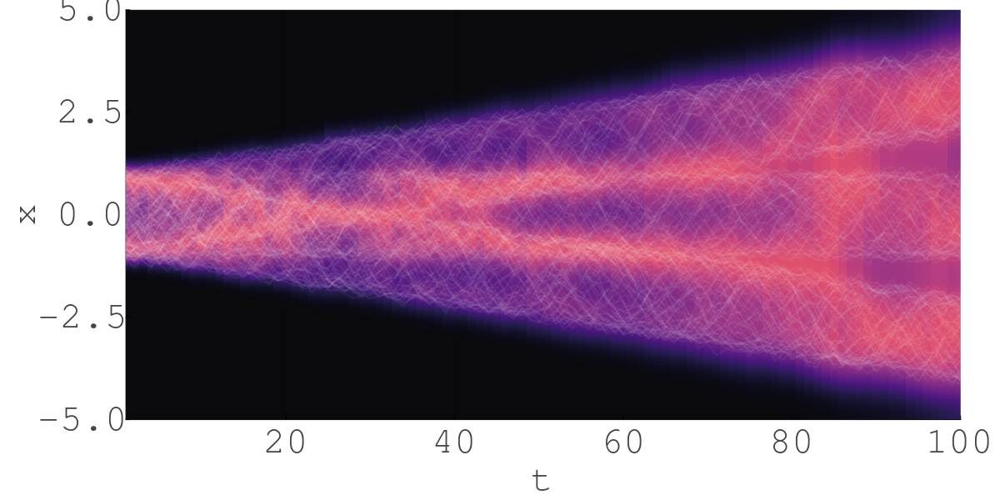

In [335]:
nts_train_dist = make_kde_heatmap(X_train_nts, collect(1:100), 200, max_x=5.0, min_x=-5.0)

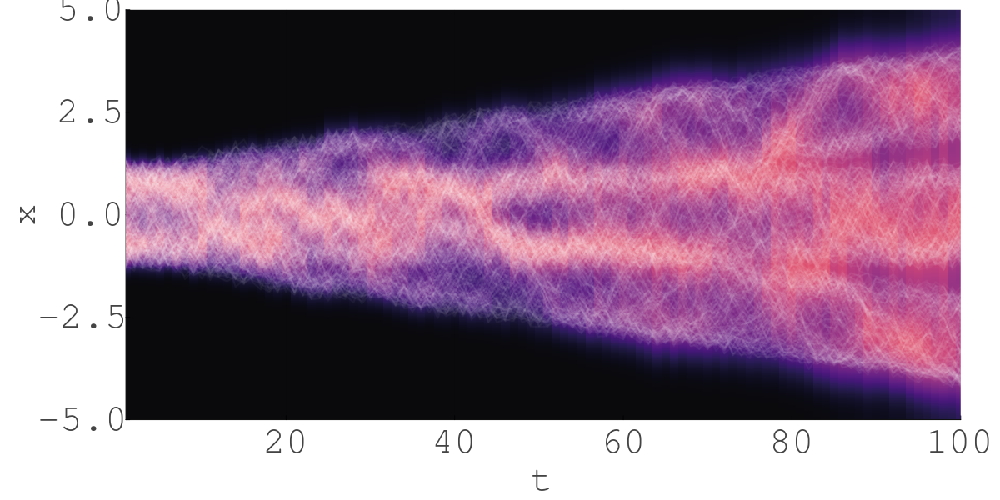

In [309]:
nts_synth_dist = make_kde_heatmap(hcat(imputed_ts_nts...)', collect(1:100), 600, max_x=5.0, min_x=-5.0)

In [215]:
l = @layout [a ; b c]

2×1 Matrix{Any}:
 (label = :a, blank = false)
 Any[(label = :b, blank = false) (label = :c, blank = false)]

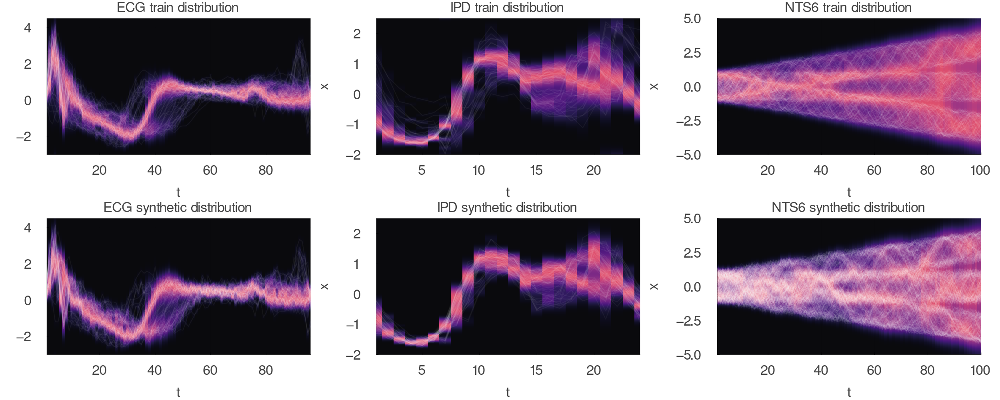

In [339]:
fstyle = font(23, "Helvetica")
plot(ecg_train_dist, ipd_train_dist, 
    nts_train_dist, ecg_synth_dist, 
    ipd_synth_dist, nts_synth_dist, 
    layout=(2, 3), 
    size=(2500, 1000),
    top_margin=5mm, bottom_margin=15mm, right_margin=10mm, left_margin=6mm,
    guidefont=fstyle,
    xtickfont=fstyle,
    ytickfont=fstyle,
    titlefont=fstyle,
    title=["ECG train distribution" "IPD train distribution" "NTS6 train distribution" "ECG synthetic distribution" "IPD synthetic distribution" "NTS6 synthetic distribution"])
#savefig("synthetic_datagen_paper.svg")